# TAREAS:

## P4 a
- Detección y seguimiento de vehículos, matrículas y personas
    Para la detección de matrículas:
    - Detectar un coche, en la parte inferior y buscando una zona rectangular
    - Entrenar Yolo (Usar otro YOLO que no sea yolo nano)

- Cuente el total de cada clase
- Visualizar en el vídeo
- Genrar un csv con el resultado de la detección y seguimiento
- Enlace al video resultante

- Determinar el flujo y o dirección de los objetos
    - Restar bounding box inicial con el posterior y ver si positivo o negativo

- Anonimizar a las personas y a las matrículas

## P4 b
- Dtectar y mostrar los caracteres y numeros de la matricula
    - con orcs
    - con vlm
- comparación entre vlm y ocrs

# Anotaciones de cara a código

- Batch -> -1 -> Yolo ajusta automáticamente

# Bibliografía

- Dataset kaggle solo imágenes sin anotar: https://www.kaggle.com/datasets/kshitij192/cars-image-dataset?resource=download
- Descarga del tesseract: https://github.com/UB-Mannheim/tesseract/wiki
-

# Para Readme

- Explicar por qué se eligió el modelo nano

# Importaciones

In [1]:
import os
import torch
from ultralytics import YOLO
from transformers import AutoProcessor, AutoModelForImageTextToText
from PIL import Image

# Evitar crash OpenMP en Windows
os.environ["KMP_DUPLICATE_LIB_OK"] = "TRUE"

# Forzar GPU si está disponible
device = "cuda" if torch.cuda.is_available() else "cpu"


c:\Users\asmae\anaconda3\envs\VC_P4\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Verificación de uso de GPU

In [24]:
print("PyTorch version:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())
print("Current device:", torch.cuda.current_device())
print("Device name:", torch.cuda.get_device_name(torch.cuda.current_device()))

PyTorch version: 2.5.1+cu121
CUDA available: True
Current device: 0
Device name: NVIDIA GeForce RTX 4050 Laptop GPU


# Entrenamiendo del modelo

In [28]:
# Carga el modelo preentrenado
model = YOLO('yolo11n.pt')

model.train(
    data=r"C:\Users\asmae\Documents\INGENIERIA INFORMATICA\4 CUARTO\VC\Practicas\VC_P4&P5\dataset\data.yaml",
    epochs=100,
    imgsz=640,
    batch=16,
    name="license_plate_augmented",
    workers=2,       # para Windows/Jupyter
    plots=False,
    patience=10,     # early stopping
    augment=True,    # activa augmentations
    mosaic=1,        # combina varias imágenes
    mixup=0.5,       # mezcla imágenes 50%
    copy_paste=0.3,  # copia/pega objetos en otras imágenes
    auto_augment="randaugment"  # auto augment avanzado
)

metrics = model.val()
print(metrics)

New https://pypi.org/project/ultralytics/8.3.225 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.215  Python-3.9.23 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 4050 Laptop GPU, 6140MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=True, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.3, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=C:\Users\asmae\Documents\INGENIERIA INFORMATICA\4 CUARTO\VC\Practicas\VC_P4&P5\dataset\data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.5, mode=train, model=yolo11n.pt

# Tracking sobre el video:
## Detección  de Coches, matrícuñas y de personas

In [ ]:
import csv
import cv2
import pytesseract


base_mnodel = YOLO("yolo11n.pt")  
lp_model = YOLO(r"runs/detect/license_plate_augmented/weights/best.pt")

video_path = "C0142.MP4"
output_path = "salida_detecciones_pytesseract.mp4"
csv_path = "detecciones_pytesseract.csv"

cap = cv2.VideoCapture(video_path)
if not cap.isOpened():
    print("Error al abrir el video")
    exit()

fps = int(video.get(cv2.video_PROP_FPS))
width  = int(video.get(cv2.video_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter(output_path, fourcc, fps, (width, height))

pytesseract.pytesseract.tesseract_cmd = r"C:\Program Files\Tesseract-OCR\tesseract.exe"

with open(csv_path, mode='w', newline='') as f:
    writer = csv.writer(f)
    writer.writerow([
        "fotograma", "tipo_objeto", "confianza", "identificador_tracking",
        "x1", "y1", "x2", "y2",
        "matricula_en_su_caso", "confianza_matricula",
        "mx1", "my1", "mx2", "my2",
        "texto_matricula"
    ])

    frame_num = 0

    while True:
        ret, frame = cap.read()
        if not ret:
            break
        frame_num += 1
        display_frame = frame.copy()

        results_coco = base_mnodel.track(
            frame, classes=[0, 2], persist=True, tracker="bytetrack.yaml"
        )
        display_frame = results_coco[0].plot()
        for box in results_coco[0].boxes:
            cls_id = int(box.cls[0].item())
            conf = box.conf[0].item()
            x1, y1, x2, y2 = map(int, box.xyxy[0])
            tipo = "persona" if cls_id == 0 else "coche"
            track_id = int(box.id[0]) if box.id is not None else None

            matricula_en_su_caso = None
            conf_plate = None
            mx1 = my1 = mx2 = my2 = None
            texto_matricula = None

        
            if tipo == "coche":
                car_roi = frame[y1:y2, x1:x2]
                results_plate = lp_model.predict(car_roi, save=False, show=False)

                if len(results_plate[0].boxes) > 0:
                    matricula_en_su_caso = True
                    plate_plot = results_plate[0].plot()
                    display_frame[y1:y2, x1:x2] = plate_plot
                    plate_box = results_plate[0].boxes[0]
                    px1, py1, px2, py2 = map(int, plate_box.xyxy[0])
                    conf_plate = plate_box.conf[0].item()
                    mx1, my1, mx2, my2 = x1 + px1, y1 + py1, x1 + px2, y1 + py2
                    plate_roi = car_roi[py1:py2, px1:px2]
                    plate_roi_rgb = cv2.cvtColor(plate_roi, cv2.COLOR_BGR2RGB)
                    texto_matricula = pytesseract.image_to_string(plate_roi_rgb).replace("\n", " ").strip()



            writer.writerow([
                frame_num, tipo, conf, track_id,
                x1, y1, x2, y2,
                matricula_en_su_caso, conf_plate,
                mx1, my1, mx2, my2,
                texto_matricula
            ])
            
        out.write(display_frame)

        if cv2.waitKey(1) & 0xFF == 27:
            break

cap.release()
out.release()
cv2.destroyAllWindows()

print(f"Video procesado guardado en: {output_path}")
print(f"CSV generado en: {csv_path}")


0: 384x640 4 cars, 21.8ms
Speed: 15.9ms preprocess, 21.8ms inference, 5.7ms postprocess per image at shape (1, 3, 384, 640)

0: 512x640 (no detections), 20.7ms
Speed: 3.1ms preprocess, 20.7ms inference, 0.7ms postprocess per image at shape (1, 3, 512, 640)

0: 416x640 (no detections), 17.4ms
Speed: 2.3ms preprocess, 17.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 16.7ms
Speed: 2.0ms preprocess, 16.7ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 480x640 (no detections), 18.7ms
Speed: 2.5ms preprocess, 18.7ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 384x640 4 cars, 21.2ms
Speed: 2.6ms preprocess, 21.2ms inference, 10.9ms postprocess per image at shape (1, 3, 384, 640)

0: 512x640 (no detections), 21.5ms
Speed: 2.4ms preprocess, 21.5ms inference, 0.7ms postprocess per image at shape (1, 3, 512, 640)

0: 416x640 (no detections), 14.6ms
Speed: 2.6ms preprocess, 14.6ms inference, 0.7ms 

# Conteo de coches y personas detectadas en el vídeo

In [7]:
import csv
import cv2

def countNumberOfUniqueCarsAndPersons(archivo_csv):
    tuplas = []

    with open(archivo_csv, newline='', encoding='latin-1') as csvfile:
        lector = csv.DictReader(csvfile)
        for fila in lector:
            tipo_objeto = fila['tipo_objeto']
            identificador_tracking = fila['identificador_tracking']  
            tuplas.append((tipo_objeto, identificador_tracking))

    car_set = set()
    person_set = set()

    for item in tuplas:
        if item[0] == 'coche':
            car_set.add(item[1])
        elif item[0] == 'persona':
            person_set.add(item[1])

    print(f"Número de coches únicos detectados: {len(car_set)}")
    print(f"Número de personas únicas detectadas: {len(person_set)}")

countNumberOfUniqueCarsAndPersons("detecciones_pytesseract.csv")

Número de coches únicos detectados: 258
Número de personas únicas detectadas: 47


# Tracking sobre el video
## Identificación de vehiculos y no solo coches además de personas y matrículas
## Registro en el csv por frame para su posterior conteo
(usando Pytesseract)

In [ ]:
import csv
import cv2
import pytesseract

VEHICLE_CLASSES = {
    0: "persona",
    2: "coche",
    3: "motocicleta",
    5: "autobus",
    7: "camion"
}

base_mnodel = YOLO("yolo11n.pt")  
lp_model = YOLO(r"runs/detect/license_plate_augmented/weights/best.pt")

video_path = "C0142.MP4"
output_path = "salida_detecciones_vehiculos_personas_y_matriculas_pytesseract.mp4"
csv_path = "detecciones_vehiculos_personas_y_matriculas_pytesseract.csv"

cap = cv2.VideoCapture(video_path)
if not cap.isOpened():
    print("Error al abrir el video")
    exit()

fps = int(cap.get(cv2.CAP_PROP_FPS))
width  = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter(output_path, fourcc, fps, (width, height))

pytesseract.pytesseract.tesseract_cmd = r"C:\Program Files\Tesseract-OCR\tesseract.exe"

with open(csv_path, mode='w', newline='') as f:
    writer = csv.writer(f)
    writer.writerow([
        "fotograma", "tipo_objeto", "confianza", "identificador_tracking",
        "x1", "y1", "x2", "y2",
        "matricula_en_su_caso", "confianza_matricula",
        "mx1", "my1", "mx2", "my2",
        "texto_matricula"
    ])

    frame_num = 0

    while True and frame_num < 800:
        ret, frame = cap.read()
        if not ret:
            break
        frame_num += 1
        display_frame = frame.copy()

        results_coco = base_mnodel.track(
            frame, 
            classes=[0, 2, 3, 5, 7], 
            persist=True, 
            tracker="bytetrack.yaml"
        )

        display_frame = results_coco[0].plot()

        for box in results_coco[0].boxes:
            cls_id = int(box.cls[0].item())
            conf = box.conf[0].item()
            x1, y1, x2, y2 = map(int, box.xyxy[0])
            model = VEHICLE_CLASSES.get(cls_id, "desconocido")
            track_id = int(box.id[0]) if box.id is not None else None

            plate_detected = False
            conf_plate = None
            mx1 = my1 = mx2 = my2 = None
            plate_text = None

            if model != "persona":
                vehicle_roi = frame[y1:y2, x1:x2]
                results_plate = lp_model.predict(car_roi, save=False, show=False)

                if len(results_plate[0].boxes) > 0:
                    plate_detected = True
                    plate_plot = results_plate[0].plot()
                    display_frame[y1:y2, x1:x2] = plate_plot
                    plate_box = results_plate[0].boxes[0]
                    px1, py1, px2, py2 = map(int, plate_box.xyxy[0])
                    conf_plate = plate_box.conf[0].item()
                    mx1, my1, mx2, my2 = x1 + px1, y1 + py1, x1 + px2, y1 + py2
                    plate_roi = vehicle_roi[py1:py2, px1:px2]
                    plate_roi_rgb = cv2.cvtColor(plate_roi, cv2.COLOR_BGR2RGB)
                    plate_text = pytesseract.image_to_string(plate_roi_rgb).replace("\n", " ").strip()

            writer.writerow([
                frame_num, 
                tipo,
                conf,
                track_id,
                x1, y1, x2, y2,
                plate_detected,
                conf_plate,
                mx1, my1, mx2, my2,
                plate_text
            ])
            
        out.write(display_frame)

        if cv2.waitKey(1) & 0xFF == 27:
            break

cap.release()
out.release()
cv2.destroyAllWindows()

print(f"Video procesado guardado en: {output_path}")
print(f"CSV generado en: {csv_path}")


0: 384x640 4 cars, 1 bus, 21.8ms
Speed: 12.7ms preprocess, 21.8ms inference, 7.4ms postprocess per image at shape (1, 3, 384, 640)

0: 608x640 (no detections), 26.8ms
Speed: 4.2ms preprocess, 26.8ms inference, 0.9ms postprocess per image at shape (1, 3, 608, 640)

0: 608x640 (no detections), 20.3ms
Speed: 3.6ms preprocess, 20.3ms inference, 0.8ms postprocess per image at shape (1, 3, 608, 640)

0: 608x640 (no detections), 20.6ms
Speed: 3.9ms preprocess, 20.6ms inference, 1.4ms postprocess per image at shape (1, 3, 608, 640)

0: 608x640 (no detections), 20.4ms
Speed: 3.9ms preprocess, 20.4ms inference, 0.8ms postprocess per image at shape (1, 3, 608, 640)

0: 608x640 (no detections), 20.7ms
Speed: 3.7ms preprocess, 20.7ms inference, 1.1ms postprocess per image at shape (1, 3, 608, 640)

0: 384x640 4 cars, 1 bus, 15.4ms
Speed: 5.9ms preprocess, 15.4ms inference, 5.8ms postprocess per image at shape (1, 3, 384, 640)

0: 608x640 (no detections), 20.3ms
Speed: 4.1ms preprocess, 20.3ms infe

# Tracking sobre el video
## Identificación de vehiculos y no solo coches además de personas y matrículas
## Registro en el csv por frame para su posterior conteo
(usando SmalLVM)

In [ ]:
import re
import torch
import cv2
from PIL import Image
from transformers import AutoProcessor, AutoModelForVision2Seq

# Cargar modelo y procesador (usa Vision2Seq para que tenga .generate)
processor = AutoProcessor.from_pretrained("HuggingFaceTB/SmolVLM-Instruct")
model = AutoModelForVision2Seq.from_pretrained(
    "HuggingFaceTB/SmolVLM-Instruct",
    torch_dtype=torch.float16,
    device_map="auto",
    offload_folder="./offload",
    offload_state_dict=True
)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

messages_prompt = "User: <image> Can you give me the text in the license plate of the image? (only plate text) no more text in the response, just the plate text\nAssistant:"

def extract_plate_text_smolvlm(plate_image_bgr):
    """Extrae el texto de la matrícula usando SmolVLM."""
    if plate_image_bgr is None or plate_image_bgr.size == 0:
        return None

    # Convertir BGR → RGB → PIL
    plate_rgb = cv2.cvtColor(plate_image_bgr, cv2.COLOR_BGR2RGB)
    image_pil = Image.fromarray(plate_rgb)

    # Preparar entradas
    inputs = processor(text=messages_prompt, images=[image_pil], return_tensors="pt").to(device)

    # Usar generate (ahora sí funciona con AutoModelForVision2Seq)
    with torch.no_grad():
        generated_ids = model.generate(**inputs, max_new_tokens=16)

    generated_texts = processor.batch_decode(generated_ids, skip_special_tokens=True)
    respuesta = generated_texts[0].split("Assistant:")[-1].strip()

    # Limpieza: extraer solo la matrícula
    match = re.search(r'\b\d{3,4}\s?[A-Z]{1,3}\b', respuesta)
    if match:
        respuesta_limpia = match.group(0)
    else:
        respuesta_limpia = respuesta

    respuesta_limpia = respuesta_limpia.replace(" ", "").replace("\n", "").replace("-", "")
    return respuesta_limpia


c:\Users\asmae\anaconda3\envs\VC_P4\lib\site-packages\transformers\models\auto\modeling_auto.py:2284: FutureWarning: The class `AutoModelForVision2Seq` is deprecated and will be removed in v5.0. Please use `AutoModelForImageTextToText` instead.
  warnings.warn(


In [ ]:
import csv
import cv2
import pytesseract

VEHICLE_CLASSES = {
    0: "persona",
    2: "coche",
    3: "motocicleta",
    5: "autobus",
    7: "camion"
}

base_mnodel = YOLO("yolo11n.pt")  
lp_model = YOLO(r"runs/detect/license_plate_augmented/weights/best.pt")

video_path = "C0142.MP4"
output_path = "salida_detecciones_vehiculos_personas_y_matriculas_smolvlm.mp4"
csv_path = "detecciones_vehiculos_personas_y_matriculas_pytesseract.csv"

cap = cv2.VideoCapture(video_path)
if not cap.isOpened():
    print("Error al abrir el video")
    exit()

fps = int(cap.get(cv2.CAP_PROP_FPS))
width  = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter(output_path, fourcc, fps, (width, height))

pytesseract.pytesseract.tesseract_cmd = r"C:\Program Files\Tesseract-OCR\tesseract.exe"

with open(csv_path, mode='w', newline='') as f:
    writer = csv.writer(f)
    writer.writerow([
        "fotograma", "tipo_objeto", "confianza", "identificador_tracking",
        "x1", "y1", "x2", "y2",
        "matricula_en_su_caso", "confianza_matricula",
        "mx1", "my1", "mx2", "my2",
        "texto_matricula"
    ])

    frame_num = 0

    while True and frame_num < 800:
        ret, frame = cap.read()
        if not ret:
            break
        frame_num += 1
        display_frame = frame.copy()

        results_coco = base_mnodel.track(
            frame, 
            classes=[0, 2, 3, 5, 7], 
            persist=True, 
            tracker="bytetrack.yaml"
        )

        display_frame = results_coco[0].plot()

        for box in results_coco[0].boxes:
            cls_id = int(box.cls[0].item())
            conf = box.conf[0].item()
            x1, y1, x2, y2 = map(int, box.xyxy[0])
            class_model = VEHICLE_CLASSES.get(cls_id, "desconocido")
            track_id = int(box.id[0]) if box.id is not None else None

            plate_detected = False
            conf_plate = None
            mx1 = my1 = mx2 = my2 = None
            plate_text = None

            if class_model != "persona":
                vehicle_roi = frame[y1:y2, x1:x2]
                results_plate = lp_model.predict(vehicle_roi, save=False, show=False)

                if len(results_plate[0].boxes) > 0:
                    plate_detected = True
                    plate_plot = results_plate[0].plot()
                    display_frame[y1:y2, x1:x2] = plate_plot
                    plate_box = results_plate[0].boxes[0]
                    px1, py1, px2, py2 = map(int, plate_box.xyxy[0])
                    conf_plate = plate_box.conf[0].item()
                    mx1, my1, mx2, my2 = x1 + px1, y1 + py1, x1 + px2, y1 + py2
                    plate_roi = vehicle_roi[py1:py2, px1:px2]
                    plate_roi_rgb = cv2.cvtColor(plate_roi, cv2.COLOR_BGR2RGB)
                    plate_text = extract_plate_text_smolvlm(plate_roi)
                    if plate_text:
                        print(f"\nFrame {frame_num} - Matrícula detectada: {plate_text}")

            writer.writerow([
                frame_num, 
                class_model,
                conf,
                track_id,
                x1, y1, x2, y2,
                plate_detected,
                conf_plate,
                mx1, my1, mx2, my2,
                plate_text
            ])
            
        out.write(display_frame)

        if cv2.waitKey(1) & 0xFF == 27:
            break

cap.release()
out.release()
cv2.destroyAllWindows()

print(f"Video procesado guardado en: {output_path}")
print(f"CSV generado en: {csv_path}")


0: 384x640 4 cars, 1 bus, 21.0ms
Speed: 3.1ms preprocess, 21.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 544x640 2 license_plates, 37.8ms
Speed: 9.8ms preprocess, 37.8ms inference, 8.6ms postprocess per image at shape (1, 3, 544, 640)

Frame 1 - Matrícula detectada: LasPalmasBus..

0: 512x640 (no detections), 77.2ms
Speed: 1.4ms preprocess, 77.2ms inference, 0.7ms postprocess per image at shape (1, 3, 512, 640)

0: 416x640 (no detections), 83.0ms
Speed: 1.4ms preprocess, 83.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 13.1ms
Speed: 1.6ms preprocess, 13.1ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)

0: 480x640 (no detections), 74.1ms
Speed: 1.7ms preprocess, 74.1ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 384x640 4 cars, 1 bus, 12.8ms
Speed: 2.0ms preprocess, 12.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 544x640 3 license_pla

# Anonimación de objetos detecatdos en el vídeo

In [ ]:
import cv2

def anonimize(frame, *box):
    x1, y1,x2, y2 = box
    frame_copy = frame[y1:y2, x1:x2].copy()
    return cv2.GaussianBlur(frame_copy, (51,51), 15)

In [ ]:
import pytesseract


base_mnodel = YOLO("yolo11n.pt")  
lp_model = YOLO(r"runs/detect/license_plate_augmented/weights/best.pt")

video_path = "C0142.MP4"
output_path = "salida_anonimación_de_personas.mp4"

cap = cv2.VideoCapture(video_path)
if not cap.isOpened():
    print("Error al abrir el video")
    exit()

# Extraer propiedades del video original para replicarlas en la salida
fps = int(cap.get(cv2.CAP_PROP_FPS))           # Fotogramas por segundo
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))  # Ancho
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT)) # Alto

# Codec de video: 'mp4v' es compatible con la mayoría de reproductores
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter(output_path, fourcc, fps, (width, height))

frame_num = 0

while True and frame_num<500:
    ret, frame = cap.read()
    if not ret:
        break
    frame_num += 1
    #display_frame = frame.copy()

    results_coco = base_mnodel.track(
        frame, 
        classes=[0, 2], 
        persist=True, 
        tracker="bytetrack.yaml"
    )

    for box in results_coco[0].boxes:
        # ID de clase (0=person, 2=car)
        cls_id = int(box.cls[0].item())
        #conf = box.conf[0].item()

        x1, y1, x2, y2 = map(int, box.xyxy[0])
        tipo = "persona" if cls_id == 0 else "coche"
        
        if tipo == "persona":
            if y2 > y1 and x2 > x1:
                blurred_roi = anonimize(frame, x1, y1, x2, y2)
                frame[y1:y2, x1:x2] = blurred_roi
                #frame[y1:y2, x1:x2] = anonimize(frame, x1, y1, x2, y2)


    display_frame = frame.copy()

    for box in results_coco[0].boxes:
        # ID de clase (0=person, 2=car)
        cls_id = int(box.cls[0].item()) 
        conf = box.conf[0].item() # Confianza de la detección [0-1]

        x1, y1, x2, y2 = map(int, box.xyxy[0])
        tipo = "persona" if cls_id == 0 else "coche"
        
        # Obtener ID de tracking (puede ser None si el objeto acaba de aparecer)
        track_id = int(box.id[0]) if box.id is not None else None

        color = (0, 255, 0) if tipo == "coche" else (0, 0, 255)
        cv2.rectangle(display_frame, (x1, y1), (x2, y2), color, 2)

        label = f"{tipo} ID:{track_id} {conf:.2f}"
        cv2.putText(display_frame, label, (x1, y1-10), 
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)
        
        if tipo == "coche":
            car_roi = frame[y1:y2, x1:x2]
            results_plate = lp_model.predict(car_roi, save=False, show=False)

            if len(results_plate[0].boxes) > 0:
            # Inferencia del modelo custom SOLO en esta ROI
                results_plate = lp_model.predict(car_roi, save=False, show=False)
            
            # Si se detectó al menos una matrícula
            if len(results_plate[0].boxes) > 0:
                # Tomar la detección con mayor confianza (índice 0)
                plate_box = results_plate[0].boxes[0]
                px1, py1, px2, py2 = map(int, plate_box.xyxy[0])
                conf_plate = plate_box.conf[0].item()
                
                # CONVERSIÓN DE COORDENADAS: Relativas → Absolutas
                # Las coordenadas (px1, py1, px2, py2) son relativas a car_roi
                # Necesitamos convertirlas al sistema de coordenadas del frame completo
                mx1, my1, mx2, my2 = x1 + px1, y1 + py1, x1 + px2, y1 + py2
                
                # Dibujar bounding box de la matrícula (azul)
                cv2.rectangle(display_frame, (mx1, my1), (mx2, my2), (255, 0, 0), 2)

                plate_roi = car_roi[py1:py2, px1:px2]
                
                # Validación: asegurar que la ROI tiene contenido
                if plate_roi.size > 0:
                    # Tesseract requiere RGB (OpenCV usa BGR por defecto)
                    plate_roi_rgb = cv2.cvtColor(plate_roi, cv2.COLOR_BGR2RGB)
                    
                    # Configuración de Tesseract:
                    # --psm 7: Asumir una sola línea de texto
                    # tessedit_char_whitelist: Solo caracteres alfanuméricos
                    #   (elimina símbolos raros que Tesseract podría "ver")
                    texto_matricula = pytesseract.image_to_string(
                        plate_roi_rgb,
                        config='--psm 7 -c tessedit_char_whitelist=ABCDEFGHIJKLMNOPQRSTUVWXYZ0123456789'
                    ).replace("\n", " ").strip()
                    
                    # Mostrar texto sobre la matrícula (si se detectó algo)
                    if texto_matricula:
                        cv2.putText(display_frame, texto_matricula, (mx1, my1-10),
                                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2)

    out.write(display_frame)

    # Feedback de progreso cada 30 frames (~1 segundo a 30fps)
    if frame_num % 30 == 0:
        print(f"Procesando frame {frame_num}...")

    if cv2.waitKey(1) & 0xFF == 27: #ESC
        break

cap.release()
out.release()
cv2.destroyAllWindows()

print(f"Video procesado guardado en: {output_path}")
print(f"Total de frames procesados: {frame_num}")




0: 384x640 4 cars, 23.5ms
Speed: 11.6ms preprocess, 23.5ms inference, 5.3ms postprocess per image at shape (1, 3, 384, 640)

0: 512x640 (no detections), 23.3ms
Speed: 3.0ms preprocess, 23.3ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 640)

0: 416x640 (no detections), 26.6ms
Speed: 2.6ms preprocess, 26.6ms inference, 4.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 19.9ms
Speed: 4.2ms preprocess, 19.9ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)

0: 480x640 (no detections), 22.5ms
Speed: 2.7ms preprocess, 22.5ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 384x640 4 cars, 17.6ms
Speed: 2.9ms preprocess, 17.6ms inference, 8.1ms postprocess per image at shape (1, 3, 384, 640)

0: 512x640 (no detections), 16.9ms
Speed: 3.0ms preprocess, 16.9ms inference, 0.7ms postprocess per image at shape (1, 3, 512, 640)

0: 416x640 (no detections), 17.9ms
Speed: 7.2ms preprocess, 17.9ms inference, 0.7ms p

# Anonimación de personas Y MATRÍCULAS

In [ ]:

base_mnodel = YOLO("yolo11n.pt")  
lp_model = YOLO(r"runs/detect/license_plate_augmented/weights/best.pt")

video_path = "C0142.MP4"
output_path = "salida_anonimación_de_personas_y_matriculas.mp4"

cap = cv2.VideoCapture(video_path)
if not cap.isOpened():
    print("Error al abrir el video")
    exit()

# Extraer propiedades del video original para replicarlas en la salida
fps = int(cap.get(cv2.CAP_PROP_FPS))           # Fotogramas por segundo
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))  # Ancho
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT)) # Alto

# Codec de video: 'mp4v' es compatible con la mayoría de reproductores
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter(output_path, fourcc, fps, (width, height))

frame_num = 0

while True and frame_num<1000:
    ret, frame = cap.read()
    if not ret:
        break
    frame_num += 1
    #display_frame = frame.copy()

    results_coco = base_mnodel.track(
        frame, 
        classes=[0, 2], 
        persist=True, 
        tracker="bytetrack.yaml"
    )

    for box in results_coco[0].boxes:
        # ID de clase (0=person, 2=car)
        cls_id = int(box.cls[0].item())
        #conf = box.conf[0].item()

        x1, y1, x2, y2 = map(int, box.xyxy[0])
        tipo = "persona" if cls_id == 0 else "coche"
        
        if tipo == "persona":
            if y2 > y1 and x2 > x1:
                blurred_roi = anonimize(frame, x1, y1, x2, y2)
                frame[y1:y2, x1:x2] = blurred_roi
                #frame[y1:y2, x1:x2] = anonimize(frame, x1, y1, x2, y2)
        
        if tipo == "coche":
            car_roi = frame[y1:y2, x1:x2]
            results_plate = lp_model.predict(car_roi, save=False, show=False)

            # Si se detectó al menos una matrícula
            if len(results_plate[0].boxes) > 0:
                # Tomar la detección con mayor confianza (índice 0)
                plate_box = results_plate[0].boxes[0]
                px1, py1, px2, py2 = map(int, plate_box.xyxy[0])
                
                mx1, my1, mx2, my2 = x1 + px1, y1 + py1, x1 + px2, y1 + py2
                if my2>my1 and mx2>mx1:
                    blurred_plate_roi = anonimize(display_frame, mx1, my1, mx2, my2)
                    frame[my1:my2, mx1:mx2] = blurred_plate_roi

    display_frame = frame.copy()

    for box in results_coco[0].boxes:
        # ID de clase (0=person, 2=car)
        cls_id = int(box.cls[0].item()) 
        conf = box.conf[0].item() # Confianza de la detección [0-1]

        x1, y1, x2, y2 = map(int, box.xyxy[0])
        tipo = "persona" if cls_id == 0 else "coche"
        
        # Obtener ID de tracking (puede ser None si el objeto acaba de aparecer)
        track_id = int(box.id[0]) if box.id is not None else None

        color = (0, 255, 0) if tipo == "coche" else (0, 0, 255)
        cv2.rectangle(display_frame, (x1, y1), (x2, y2), color, 2)

        label = f"{tipo} ID:{track_id} {conf:.2f}"
        cv2.putText(display_frame, label, (x1, y1-10), 
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)
        
        if tipo == "coche":
            car_roi = frame[y1:y2, x1:x2]
            results_plate = lp_model.predict(car_roi, save=False, show=False)

            if len(results_plate[0].boxes) > 0:
            # Inferencia del modelo custom SOLO en esta ROI
                results_plate = lp_model.predict(car_roi, save=False, show=False)
            
            # Si se detectó al menos una matrícula
            if len(results_plate[0].boxes) > 0:
                # Tomar la detección con mayor confianza (índice 0)
                plate_box = results_plate[0].boxes[0]
                px1, py1, px2, py2 = map(int, plate_box.xyxy[0])
                conf_plate = plate_box.conf[0].item()
                
                # CONVERSIÓN DE COORDENADAS: Relativas → Absolutas
                # Las coordenadas (px1, py1, px2, py2) son relativas a car_roi
                # Necesitamos convertirlas al sistema de coordenadas del frame completo
                mx1, my1, mx2, my2 = x1 + px1, y1 + py1, x1 + px2, y1 + py2
                
                # Dibujar bounding box de la matrícula (azul)
                cv2.rectangle(display_frame, (mx1, my1), (mx2, my2), (255, 0, 0), 2)
                
                plate_roi = car_roi[py1:py2, px1:px2]
                
                # Validación: asegurar que la ROI tiene contenido
                if plate_roi.size > 0:
                    # Tesseract requiere RGB (OpenCV usa BGR por defecto)
                    plate_roi_rgb = cv2.cvtColor(plate_roi, cv2.COLOR_BGR2RGB)
                    
                    # Configuración de Tesseract:
                    # --psm 7: Asumir una sola línea de texto
                    # tessedit_char_whitelist: Solo caracteres alfanuméricos
                    #   (elimina símbolos raros que Tesseract podría "ver")
                    texto_matricula = pytesseract.image_to_string(
                        plate_roi_rgb,
                        config='--psm 7 -c tessedit_char_whitelist=ABCDEFGHIJKLMNOPQRSTUVWXYZ0123456789'
                    ).replace("\n", " ").strip()
                    
                    # Mostrar texto sobre la matrícula (si se detectó algo)
                    if texto_matricula:
                        cv2.putText(display_frame, texto_matricula, (mx1, my1-10),
                                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2)

    out.write(display_frame)

    # Feedback de progreso cada 30 frames (~1 segundo a 30fps)
    if frame_num % 30 == 0:
        print(f"Procesando frame {frame_num}...")

    if cv2.waitKey(1) & 0xFF == 27: #ESC
        break

cap.release()
out.release()
cv2.destroyAllWindows()

print(f"Video procesado guardado en: {output_path}")
print(f"Total de frames procesados: {frame_num}")




0: 384x640 4 cars, 24.4ms
Speed: 14.0ms preprocess, 24.4ms inference, 7.1ms postprocess per image at shape (1, 3, 384, 640)

0: 512x640 (no detections), 27.0ms
Speed: 2.6ms preprocess, 27.0ms inference, 0.8ms postprocess per image at shape (1, 3, 512, 640)

0: 416x640 (no detections), 20.6ms
Speed: 2.5ms preprocess, 20.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 19.5ms
Speed: 2.6ms preprocess, 19.5ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)

0: 480x640 (no detections), 23.7ms
Speed: 3.8ms preprocess, 23.7ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 512x640 (no detections), 24.6ms
Speed: 2.5ms preprocess, 24.6ms inference, 1.4ms postprocess per image at shape (1, 3, 512, 640)

0: 416x640 (no detections), 20.7ms
Speed: 2.4ms preprocess, 20.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 12.7ms
Speed: 1.7ms preprocess, 12.7ms inference

# Recorte de imagenes con las detecciones del modelo:

In [27]:
import os
import cv2
from ultralytics import YOLO
from pathlib import Path


def crop_and_save_detections(
    model_path,
    input_dir,
    output_dir,
    conf_threshold=0.5,
    class_filter=None,
    save_empty_images=False
):
    
    model = YOLO(model_path)
    
    # Crear directorio de salida
    output_path = Path(output_dir)
    output_path.mkdir(parents=True, exist_ok=True)
    
    # Crear subdirectorio para imágenes sin detecciones (opcional)
    if save_empty_images:
        no_detection_path = output_path / "sin_detecciones"
        no_detection_path.mkdir(exist_ok=True)
    
    # Extensiones de imagen válidas
    valid_extensions = {'.jpg', '.jpeg', '.png', '.heic', '.HEIC', '.webp'}
    
    # Obtener lista de imágenes
    input_path = Path(input_dir)
    image_files = [
        f for f in input_path.iterdir() 
        if f.suffix.lower() in valid_extensions and len(f.stem.split("_" )) == 1
    ]
    
    # Estadísticas
    stats = {
        'total_images': len(image_files),
        'images_with_detections': 0,
        'images_without_detections': 0,
        'total_crops': 0,
        'crops_per_class': {}
    }
    
    # Procesar cada imagen
    for idx, image_file in enumerate(image_files, 1):
        # Leer imagen
        img = cv2.imread(str(image_file))
        
        if img is None:
            print(f"Error al leer: {image_file.name}")
            continue
        
        # Realizar predicción
        results = model.predict(
            img,
            conf=conf_threshold,
            classes=class_filter,
            save=False,
            verbose=False
        )
        
        detections = results[0].boxes
        num_detections = len(detections)
        
        # Si no hay detecciones
        if num_detections == 0:
            stats['images_without_detections'] += 1
            
            if save_empty_images:
                # Guardar imagen original en carpeta de "sin detecciones"
                output_file = no_detection_path / image_file.name
                cv2.imwrite(str(output_file), img)
            
            print(f"[{idx}/{len(image_files)}] {image_file.name}: 0 detecciones")
            continue
        
        # Hay detecciones
        stats['images_with_detections'] += 1
        
        # Procesar cada detección
        for det_idx, box in enumerate(detections):
            # Obtener información de la detección
            x1, y1, x2, y2 = map(int, box.xyxy[0])
            conf = box.conf[0].item()
            cls_id = int(box.cls[0].item())
            
            # Validar coordenadas
            if x2 <= x1 or y2 <= y1:
                continue
            
            # Recortar región
            crop = img[y1:y2, x1:x2]
            
            if crop.size == 0:
                continue
            
            # Generar nombre del archivo
            # Formato: original_name_det0_class2_conf0.95.jpg
            name_without_ext = image_file.stem
            crop_filename = f"{name_without_ext}.jpg"
            crop_path = output_path / crop_filename
            
            # Guardar recorte
            cv2.imwrite(str(crop_path), crop)
            
            # Actualizar estadísticas
            stats['total_crops'] += 1
            stats['crops_per_class'][cls_id] = stats['crops_per_class'].get(cls_id, 0) + 1
        
        print(f"[{idx}/{len(image_files)}] {image_file.name}: {num_detections} detecciones → {num_detections} recortes guardados")
    
    # Imprimir resumen
    print("\n" + "=" * 70)
    print("📊 RESUMEN DEL PROCESAMIENTO")
    print("=" * 70)
    print(f"Total de imágenes procesadas:     {stats['total_images']}")
    print(f"Imágenes CON detecciones:         {stats['images_with_detections']}")
    print(f"Imágenes SIN detecciones:         {stats['images_without_detections']}")
    print(f"Total de recortes guardados:      {stats['total_crops']}")
    print("\nRecortes por clase:")
    for cls_id, count in sorted(stats['crops_per_class'].items()):
        print(f"  Clase {cls_id}: {count} recortes")
    print("=" * 70)
    
    return stats



In [28]:
stats = crop_and_save_detections(
    model_path="runs/detect/license_plate_augmented/weights/best.pt",
    input_dir="C:/Users/asmae/Documents/INGENIERIA INFORMATICA/4 CUARTO/VC/Practicas/VC_P4&P5/dataset/train/images",
    output_dir="C:/Users/asmae/Documents/INGENIERIA INFORMATICA/4 CUARTO/VC/Practicas/VC_P4&P5/dataset_matriculas_recortadas",
    conf_threshold=0.5  # Solo detecciones con confianza > 50%
)

stats = crop_and_save_detections(
    model_path="runs/detect/license_plate_augmented/weights/best.pt",
    input_dir="C:/Users/asmae/Documents/INGENIERIA INFORMATICA/4 CUARTO/VC/Practicas/VC_P4&P5/dataset/val/images",
    output_dir="C:/Users/asmae/Documents/INGENIERIA INFORMATICA/4 CUARTO/VC/Practicas/VC_P4&P5/dataset_matriculas_recortadas",
    conf_threshold=0.5  # Solo detecciones con confianza > 50%
)

[1/63] 0116GPD.jpg: 1 detecciones → 1 recortes guardados
[2/63] 0116HGV.jpg: 1 detecciones → 1 recortes guardados
[3/63] 0241JZP.jpg: 1 detecciones → 1 recortes guardados
[4/63] 0303BML.jpg: 1 detecciones → 1 recortes guardados
[5/63] 0415JVS.jpeg: 1 detecciones → 1 recortes guardados
[6/63] 0463HVT.jpeg: 1 detecciones → 1 recortes guardados
[7/63] 0476MNN.jpg: 1 detecciones → 1 recortes guardados
[8/63] 0481KHY.jpg: 1 detecciones → 1 recortes guardados
[9/63] 0524MHT.jpg: 1 detecciones → 1 recortes guardados
[10/63] 0526HNF.jpeg: 1 detecciones → 1 recortes guardados
[11/63] 0558GZS.jpeg: 0 detecciones
[12/63] 0880DRN.jpg: 1 detecciones → 1 recortes guardados
[13/63] 0918LVY.jpg: 1 detecciones → 1 recortes guardados
[14/63] 1062FRF.jpg: 1 detecciones → 1 recortes guardados
[15/63] 1607FDB.jpeg: 0 detecciones
[16/63] 1646HWW.jpg: 1 detecciones → 1 recortes guardados
[17/63] 1670JLN.jpg: 1 detecciones → 1 recortes guardados
[18/63] 1718KBC.jpg: 1 detecciones → 1 recortes guardados
[19/63

# COMPARACIÓN ENTRE VLM Y TESSERACT

In [ ]:
import os
import cv2
import time
import pytesseract
import torch
from pathlib import Path
from transformers import AutoProcessor, AutoModelForVision2Seq
from PIL import Image
import pandas as pd
import re


class OCRComparator:
    
    def __init__(self, tesseract_path=None):
    
        # Configurar Tesseract
        if tesseract_path:
            pytesseract.pytesseract.tesseract_cmd = tesseract_path
        
        # Cargar SmolVLM
        print("Cargando modelo SmolVLM...")
        self.processor = AutoProcessor.from_pretrained("HuggingFaceTB/SmolVLM-Instruct")
        self.model = AutoModelForVision2Seq.from_pretrained(
            "HuggingFaceTB/SmolVLM-Instruct",
            torch_dtype=torch.float16,
            device_map="auto",
            offload_folder="./offload",
            offload_state_dict=True
        )
        print("SmolVLM cargado correctamente\n")
        
        # Prompt para SmolVLM
        self.smolvlm_prompt = "Extract the license plate number from this image. Return only the alphanumeric characters, no spaces or special characters."
    
    def normalize_plate_text(self, text):
        if not text:
            return ""
        
        # Convertir a mayúsculas y eliminar espacios
        text = text.upper().strip()
        
        # Eliminar todo excepto letras y números
        text = re.sub(r'[^A-Z0-9]', '', text)
        
        return text
    
    def ocr_tesseract(self, image_path):
        start_time = time.time()
        
        try:
            # Leer imagen
            img = cv2.imread(str(image_path))
            
            if img is None:
                return None, 0
            
            # Convertir a RGB
            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            
            # Configuración optimizada para matrículas
            custom_config = r'--oem 3 --psm 7 -c tessedit_char_whitelist=ABCDEFGHIJKLMNOPQRSTUVWXYZ0123456789'
            
            # Extraer texto
            text = pytesseract.image_to_string(img_rgb, config=custom_config)
            
            # Normalizar
            text = self.normalize_plate_text(text)
            
            elapsed_time = time.time() - start_time
            
            return text, elapsed_time
        
        except Exception as e:
            print(f"Error en Tesseract con {image_path.name}: {e}")
            return None, 0
    
    def ocr_smolvlm(self, image_path):
        start_time = time.time()
        
        try:
            # Cargar imagen con PIL
            image = Image.open(image_path).convert('RGB')
            
            # Preparar mensajes
            messages = [
                {
                    "role": "user",
                    "content": [
                        {"type": "image"},
                        {"type": "text", "text": self.smolvlm_prompt}
                    ]
                }
            ]
            
            # Crear prompt
            prompt = self.processor.apply_chat_template(messages, add_generation_prompt=True)
            
            # Procesar inputs
            inputs = self.processor(
                text=prompt,
                images=[image],
                return_tensors="pt"
            )
            
            # Mover a GPU si está disponible
            inputs = {k: v.to(self.model.device) for k, v in inputs.items()}
            
            # Generar
            with torch.no_grad():
                generated_ids = self.model.generate(
                    **inputs,
                    max_new_tokens=50,
                    do_sample=False
                )
            
            # Decodificar
            generated_ids_trimmed = [
                out_ids[len(in_ids):] 
                for in_ids, out_ids in zip(inputs['input_ids'], generated_ids)
            ]
            
            output_text = self.processor.batch_decode(
                generated_ids_trimmed,
                skip_special_tokens=True,
                clean_up_tokenization_spaces=False
            )[0]
            
            # Normalizar
            text = self.normalize_plate_text(output_text)
            
            elapsed_time = time.time() - start_time
            
            return text, elapsed_time
        
        except Exception as e:
            print(f"Error en SmolVLM con {image_path.name}: {e}")
            return None, 0
    
    def calculate_accuracy_metrics(self, predicted, ground_truth):
        
        if predicted is None or ground_truth is None:
            return {
                'exact_match': False,
                'char_accuracy': 0.0,
                'levenshtein_distance': float('inf')
            }
        
        # Normalizar ambos
        pred = self.normalize_plate_text(predicted)
        gt = self.normalize_plate_text(ground_truth)
        
        # Coincidencia exacta
        exact_match = (pred == gt)
        
        # Precisión por carácter
        if len(gt) == 0:
            char_accuracy = 1.0 if len(pred) == 0 else 0.0
        else:
            matches = sum(1 for p, g in zip(pred, gt) if p == g)
            char_accuracy = matches / max(len(pred), len(gt))
        
        # Distancia de Levenshtein
        lev_dist = self.levenshtein_distance(pred, gt)
        
        return {
            'exact_match': exact_match,
            'char_accuracy': char_accuracy,
            'levenshtein_distance': lev_dist
        }
    
    @staticmethod
    def levenshtein_distance(s1, s2):
        """Calcula la distancia de Levenshtein entre dos strings"""
        if len(s1) < len(s2):
            return OCRComparator.levenshtein_distance(s2, s1)
        
        if len(s2) == 0:
            return len(s1)
        
        previous_row = range(len(s2) + 1)
        for i, c1 in enumerate(s1):
            current_row = [i + 1]
            for j, c2 in enumerate(s2):
                insertions = previous_row[j + 1] + 1
                deletions = current_row[j] + 1
                substitutions = previous_row[j] + (c1 != c2)
                current_row.append(min(insertions, deletions, substitutions))
            previous_row = current_row
        
        return previous_row[-1]
    
    def compare_ocr_methods(self, images_dir, output_csv="ocr_comparison_results.csv"):
    
        images_path = Path(images_dir)
        
        # Obtener lista de imágenes
        valid_extensions = {'.jpg', '.jpeg', '.png', '.bmp'}
        image_files = [
            f for f in images_path.iterdir() 
            if f.suffix.lower() in valid_extensions
        ]
        
        print(f"Encontradas {len(image_files)} imágenes en {images_dir}")
        print(f"Iniciando comparativa OCR...\n")
        print("=" * 80)
        
        results = []
        
        # Procesar cada imagen
        for idx, img_file in enumerate(image_files, 1):
            # Ground truth: nombre del archivo
            ground_truth = img_file.stem
            
            print(f"\n[{idx}/{len(image_files)}] Procesando: {img_file.name}")
            print(f"  Ground Truth: {ground_truth}")
            
            # OCR con Tesseract
            print("Tesseract...", end=" ")
            tess_text, tess_time = self.ocr_tesseract(img_file)
            tess_metrics = self.calculate_accuracy_metrics(tess_text, ground_truth)
            print(f"✓ ({tess_time:.3f}s) → {tess_text}")
            
            # OCR con SmolVLM
            print("SmolVLM...", end=" ")
            smol_text, smol_time = self.ocr_smolvlm(img_file)
            smol_metrics = self.calculate_accuracy_metrics(smol_text, ground_truth)
            print(f"✓ ({smol_time:.3f}s) → {smol_text}")
            
            # Guardar resultados
            result = {
                'image_name': img_file.name,
                'ground_truth': ground_truth,
                
                # Tesseract
                'tesseract_output': tess_text or "",
                'tesseract_time': tess_time,
                'tesseract_exact_match': tess_metrics['exact_match'],
                'tesseract_char_accuracy': tess_metrics['char_accuracy'],
                'tesseract_levenshtein': tess_metrics['levenshtein_distance'],
                
                # SmolVLM
                'smolvlm_output': smol_text or "",
                'smolvlm_time': smol_time,
                'smolvlm_exact_match': smol_metrics['exact_match'],
                'smolvlm_char_accuracy': smol_metrics['char_accuracy'],
                'smolvlm_levenshtein': smol_metrics['levenshtein_distance'],
            }
            
            results.append(result)
        
        # Crear DataFrame
        df = pd.DataFrame(results)
        
        # Guardar CSV
        df.to_csv(output_csv, index=False, encoding='utf-8')
        print(f"\nResultados guardados en: {output_csv}")
        
        # Imprimir resumen
        self.print_summary(df)
        
        return df
    
    def print_summary(self, df):
        """Imprime un resumen de la comparativa"""
        print("\n" + "=" * 80)
        print("RESUMEN DE LA COMPARATIVA")
        print("=" * 80)
        
        total = len(df)
        
        # Tesseract
        tess_exact = df['tesseract_exact_match'].sum()
        tess_avg_time = df['tesseract_time'].mean()
        tess_avg_accuracy = df['tesseract_char_accuracy'].mean()
        
        # SmolVLM
        smol_exact = df['smolvlm_exact_match'].sum()
        smol_avg_time = df['smolvlm_time'].mean()
        smol_avg_accuracy = df['smolvlm_char_accuracy'].mean()
        
        print(f"\nTotal de imágenes: {total}")
        
        print(f"\nTESSERACT:")
        print(f"✓ Aciertos exactos:        {tess_exact}/{total} ({tess_exact/total*100:.1f}%)")
        print(f"Precisión por carácter:  {tess_avg_accuracy*100:.1f}%")
        print(f"Tiempo promedio:        {tess_avg_time:.3f}s")
        print(f" Velocidad total:         {total*tess_avg_time:.1f}s ({total/tess_avg_time:.1f} img/s)")
        
        print(f"\nSMOLVLM:")
        print(f"✓ Aciertos exactos:        {smol_exact}/{total} ({smol_exact/total*100:.1f}%)")
        print(f"Precisión por carácter:  {smol_avg_accuracy*100:.1f}%")
        print(f"Tiempo promedio:        {smol_avg_time:.3f}s")
        print(f"Velocidad total:         {total*smol_avg_time:.1f}s ({total/smol_avg_time:.1f} img/s)")
        
        print(f"\nCOMPARACIÓN:")
        winner_accuracy = "Tesseract" if tess_exact > smol_exact else "SmolVLM" if smol_exact > tess_exact else "Empate"
        winner_speed = "Tesseract" if tess_avg_time < smol_avg_time else "SmolVLM"
        speedup = smol_avg_time / tess_avg_time if tess_avg_time < smol_avg_time else tess_avg_time / smol_avg_time
        
        print(f"\nMás preciso:     {winner_accuracy}")
        print(f"Más rápido:      {winner_speed} ({speedup:.1f}x más rápido)")
        print(f"Diferencia:      {abs(smol_exact - tess_exact)} aciertos de diferencia")
        
        print("=" * 80)


if __name__ == "__main__":
    
    # Configurar rutas
    IMAGES_DIR = "C:/Users/asmae/Documents/INGENIERIA INFORMATICA/4 CUARTO/VC/Practicas/VC_P4&P5/dataset_matriculas_recortadas"
    TESSERACT_PATH = r"C:\Program Files\Tesseract-OCR\tesseract.exe"
    OUTPUT_CSV = "comparativa_ocr_tesseract_vs_smolvlm.csv"
    
    # Crear comparador
    comparator = OCRComparator(tesseract_path=TESSERACT_PATH)
    
    # Ejecutar comparativa
    results_df = comparator.compare_ocr_methods(
        images_dir=IMAGES_DIR,
        output_csv=OUTPUT_CSV
    )
    
    # Análisis adicional (opcional)
    print("\nPrimeras 5 filas del DataFrame:")
    print(results_df.head())
    
    # Ver casos donde SmolVLM acertó y Tesseract falló
    smol_wins = results_df[
        (results_df['smolvlm_exact_match'] == True) & 
        (results_df['tesseract_exact_match'] == False)
    ]
    
    print(f"\nSmolVLM acertó donde Tesseract falló: {len(smol_wins)} casos")
    if len(smol_wins) > 0:
        print(smol_wins[['image_name', 'ground_truth', 'tesseract_output', 'smolvlm_output']].head())
    
    # Ver casos donde Tesseract acertó y SmolVLM falló
    tess_wins = results_df[
        (results_df['tesseract_exact_match'] == True) & 
        (results_df['smolvlm_exact_match'] == False)
    ]
    
    print(f"\nTesseract acertó donde SmolVLM falló: {len(tess_wins)} casos")
    if len(tess_wins) > 0:
        print(tess_wins[['image_name', 'ground_truth', 'tesseract_output', 'smolvlm_output']].head())

Cargando modelo SmolVLM...


Some parameters are on the meta device because they were offloaded to the disk and cpu.


SmolVLM cargado correctamente

Encontradas 87 imágenes en C:/Users/asmae/Documents/INGENIERIA INFORMATICA/4 CUARTO/VC/Practicas/VC_P4&P5/dataset_matriculas_recortadas
Iniciando comparativa OCR...


[1/87] Procesando: 0116GPD.jpg
  Ground Truth: 0116GPD
Tesseract... ✓ (2.442s) → 10116GPD
SmolVLM... ✓ (25.677s) → 0116GPD

[2/87] Procesando: 0116HGV.jpg
  Ground Truth: 0116HGV
Tesseract... ✓ (0.187s) → 
SmolVLM... ✓ (21.542s) → 0116HGV

[3/87] Procesando: 0241JZP.jpg
  Ground Truth: 0241JZP
Tesseract... ✓ (0.301s) → BO24J2P
SmolVLM... ✓ (22.289s) → 0261JZP

[4/87] Procesando: 0303BML.jpg
  Ground Truth: 0303BML
Tesseract... ✓ (0.197s) → 
SmolVLM... ✓ (17.964s) → 0303BML

[5/87] Procesando: 0415JVS.jpg
  Ground Truth: 0415JVS
Tesseract... ✓ (0.374s) → 
SmolVLM... ✓ (21.055s) → 0415JVS

[6/87] Procesando: 0463HVT.jpg
  Ground Truth: 0463HVT
Tesseract... ✓ (0.292s) → F0463HVT
SmolVLM... ✓ (17.753s) → 0463HV7

[7/87] Procesando: 0476MNN.jpg
  Ground Truth: 0476MNN
Tesseract... ✓ (0.323s) → 40

In [13]:
results_df = pd.read_csv(r'C:\Users\asmae\Documents\INGENIERIA INFORMATICA\4 CUARTO\VC\Practicas\VC_P4&P5\P4\comparativa_ocr_tesseract_vs_smolvlm.csv')

"""Imprime un resumen de la comparativa"""
print("\n" + "=" * 80)
print("RESUMEN DE LA COMPARATIVA")
print("=" * 80)
        
total = len(results_df)
        
# Tesseract
tess_exact = results_df['tesseract_exact_match'].sum()
tess_avg_time = results_df['tesseract_time'].mean()
tess_avg_accuracy = results_df['tesseract_char_accuracy'].mean()
        
# SmolVLM
smol_exact = results_df['smolvlm_exact_match'].sum()
smol_avg_time = results_df['smolvlm_time'].mean()
smol_avg_accuracy = results_df['smolvlm_char_accuracy'].mean()
        
print(f"\nTotal de imágenes: {total}")
        
print(f"\nTESSERACT:")
print(f"✓ Aciertos exactos:        {tess_exact}/{total} ({tess_exact/total*100:.1f}%)")
print(f"Precisión por carácter:  {tess_avg_accuracy*100:.1f}%")
print(f"Tiempo promedio:        {tess_avg_time:.3f}s")
print(f" Velocidad total:         {total*tess_avg_time:.1f}s ({total/tess_avg_time:.1f} img/s)")
        
print(f"\nSMOLVLM:")
print(f"✓ Aciertos exactos:        {smol_exact}/{total} ({smol_exact/total*100:.1f}%)")
print(f"Precisión por carácter:  {smol_avg_accuracy*100:.1f}%")
print(f"Tiempo promedio:        {smol_avg_time:.3f}s")
print(f"Velocidad total:         {total*smol_avg_time:.1f}s ({total/smol_avg_time:.1f} img/s)")
        
print(f"\nCOMPARACIÓN:")
winner_accuracy = "Tesseract" if tess_exact > smol_exact else "SmolVLM" if smol_exact > tess_exact else "Empate"
winner_speed = "Tesseract" if tess_avg_time < smol_avg_time else "SmolVLM"
speedup = smol_avg_time / tess_avg_time if tess_avg_time < smol_avg_time else tess_avg_time / smol_avg_time
        
print(f"\nMás preciso:     {winner_accuracy}")
print(f"Más rápido:      {winner_speed} ({speedup:.1f}x más rápido)")
print(f"Diferencia:      {abs(smol_exact - tess_exact)} aciertos de diferencia")
        
print("=" * 80)

# Análisis adicional (opcional)
print("\nPrimeras 5 filas del DataFrame:")
print(results_df.head())

# Ver casos donde SmolVLM acertó y Tesseract falló
smol_wins = results_df[
    (results_df['smolvlm_exact_match'] == True) & 
    (results_df['tesseract_exact_match'] == False)
]

print(f"\nSmolVLM acertó donde Tesseract falló: {len(smol_wins)} casos")
if len(smol_wins) > 0:
    print(smol_wins[['image_name', 'ground_truth', 'tesseract_output', 'smolvlm_output']].head())

# Ver casos donde Tesseract acertó y SmolVLM falló
tess_wins = results_df[
    (results_df['tesseract_exact_match'] == True) & 
    (results_df['smolvlm_exact_match'] == False)
]

print(f"\nTesseract acertó donde SmolVLM falló: {len(tess_wins)} casos")
if len(tess_wins) > 0:
    print(tess_wins[['image_name', 'ground_truth', 'tesseract_output', 'smolvlm_output']].head())


RESUMEN DE LA COMPARATIVA

Total de imágenes: 87

TESSERACT:
✓ Aciertos exactos:        12/87 (13.8%)
Precisión por carácter:  22.5%
Tiempo promedio:        0.287s
 Velocidad total:         24.9s (303.5 img/s)

SMOLVLM:
✓ Aciertos exactos:        53/87 (60.9%)
Precisión por carácter:  82.1%
Tiempo promedio:        27.730s
Velocidad total:         2412.5s (3.1 img/s)

COMPARACIÓN:

Más preciso:     SmolVLM
Más rápido:      Tesseract (96.8x más rápido)
Diferencia:      41 aciertos de diferencia

Primeras 5 filas del DataFrame:
    image_name ground_truth tesseract_output  tesseract_time  \
0  0116GPD.jpg      0116GPD         10116GPD        2.441957   
1  0116HGV.jpg      0116HGV              NaN        0.186623   
2  0241JZP.jpg      0241JZP          BO24J2P        0.301319   
3  0303BML.jpg      0303BML              NaN        0.196816   
4  0415JVS.jpg      0415JVS              NaN        0.374038   

   tesseract_exact_match  tesseract_char_accuracy  tesseract_levenshtein  \
0      

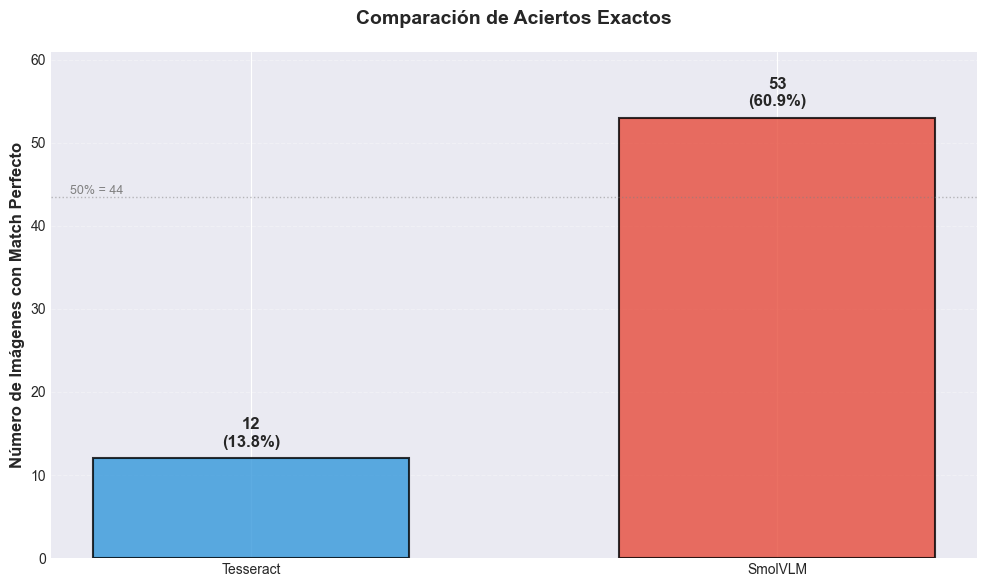

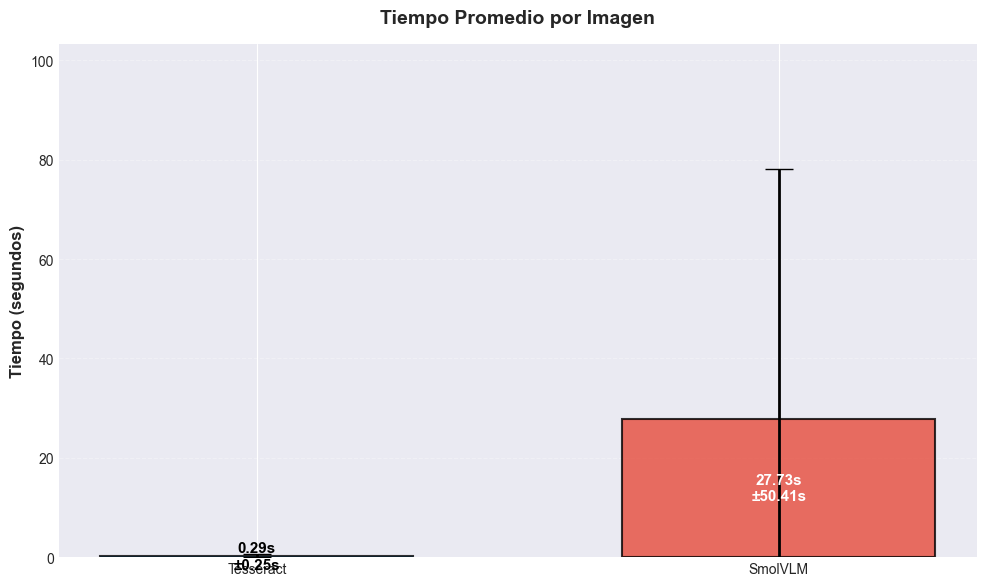

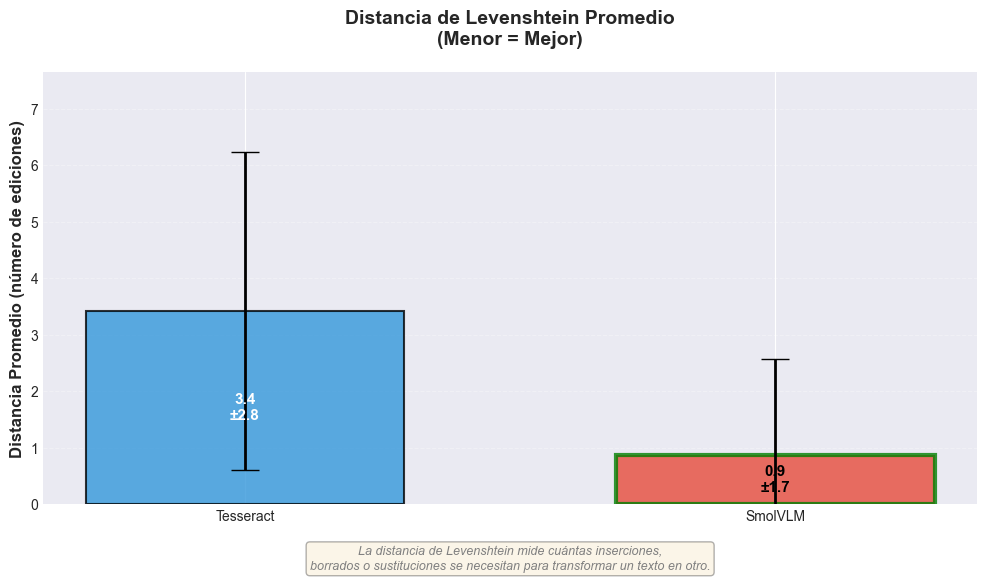

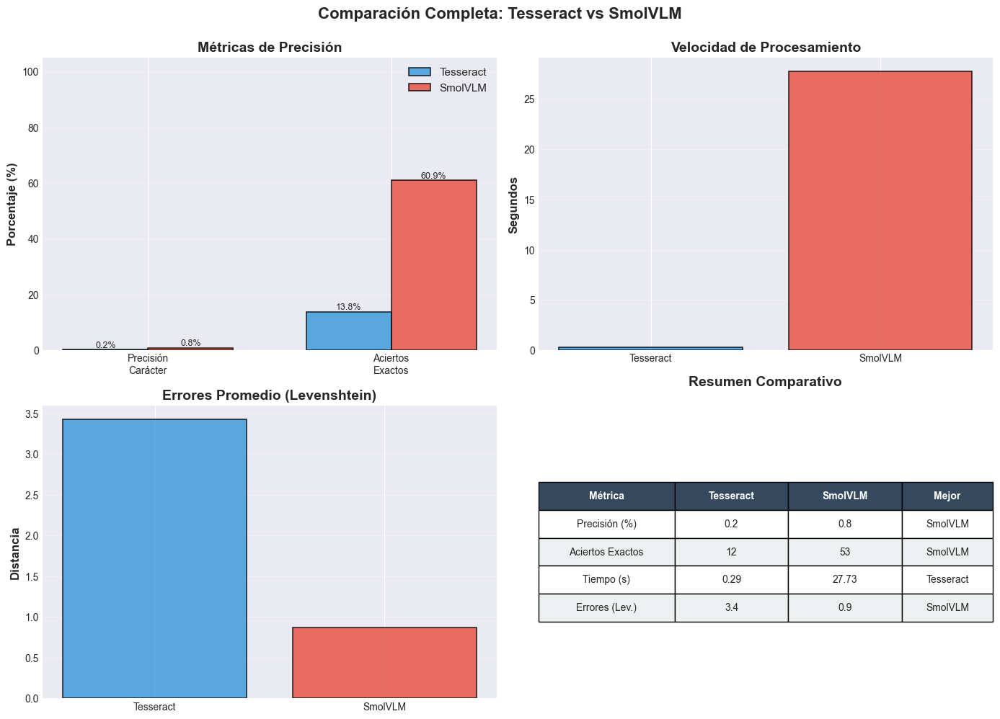

In [16]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Configuración del estilo general
plt.style.use('seaborn-v0_8-darkgrid')
colors = ['#3498db', '#e74c3c']  # Azul para Tesseract, Rojo para SmolVLM
colors_light = ['#5dade2', '#ec7063']

# Configuración de fuentes
plt.rcParams['font.size'] = 11
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10
plt.rcParams['legend.fontsize'] = 11

# ============================== 
# 2. Comparación de aciertos exactos con porcentajes
# ============================== 
fig, ax = plt.subplots(figsize=(10, 6))

method_names = ['Tesseract', 'SmolVLM']
exact_matches = [
    results_df['tesseract_exact_match'].sum(),
    results_df['smolvlm_exact_match'].sum()
]
total_images = len(results_df)
percentages = [(x/total_images)*100 for x in exact_matches]

# Barras con gradiente
bars = ax.bar(method_names, exact_matches, color=colors, 
              edgecolor='black', linewidth=1.5, alpha=0.8, width=0.6)

# Añadir valores en las barras
for i, (bar, val, pct) in enumerate(zip(bars, exact_matches, percentages)):
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2., height + max(exact_matches)*0.02,
            f'{val}\n({pct:.1f}%)',
            ha='center', va='bottom', fontweight='bold', fontsize=12)

ax.set_title('Comparación de Aciertos Exactos', fontweight='bold', pad=20)
ax.set_ylabel('Número de Imágenes con Match Perfecto', fontweight='bold')
ax.set_ylim(0, max(exact_matches) * 1.15)
ax.grid(axis='y', alpha=0.3, linestyle='--')

# Línea de referencia
ax.axhline(total_images/2, color='gray', linestyle=':', linewidth=1, alpha=0.5)
ax.text(0.02, total_images/2, f'50% = {total_images/2:.0f}', 
        transform=ax.get_yaxis_transform(), va='bottom', fontsize=9, color='gray')

plt.tight_layout()
plt.show()

# ============================== 
# 3. Tiempos de procesamiento con boxplot adicional
# ==============================
fig, ax = plt.subplots(figsize=(10, 6))

method_names = ['Tesseract', 'SmolVLM']
avg_times = [
    results_df['tesseract_time'].mean(),
    results_df['smolvlm_time'].mean()
]
std_times = [
    results_df['tesseract_time'].std(),
    results_df['smolvlm_time'].std()
]

bars = ax.bar(method_names, avg_times, color=colors, 
               edgecolor='black', linewidth=1.5, alpha=0.8, width=0.6,
               yerr=std_times, capsize=10, error_kw={'linewidth': 2})

# Valores en las barras - colocados dentro de las barras para evitar que se salgan
for i, (bar, val, std) in enumerate(zip(bars, avg_times, std_times)):
    # Posición vertical ajustada para estar dentro o justo encima de la barra
    y_pos = val * 0.5  # Centrado en la barra
    ax.text(bar.get_x() + bar.get_width()/2., y_pos,
             f'{val:.2f}s\n±{std:.2f}s',
             ha='center', va='center', fontweight='bold', fontsize=11,
             color='white' if val > max(avg_times)*0.3 else 'black')

ax.set_title('Tiempo Promedio por Imagen', fontweight='bold', pad=15)
ax.set_ylabel('Tiempo (segundos)', fontweight='bold')
ax.grid(axis='y', alpha=0.3, linestyle='--')

# Ajustar límite superior con menos espacio extra
ax.set_ylim(0, max(avg_times) + max(std_times) * 1.5)

plt.tight_layout()
plt.show()

# ============================== 
# 4. Distancia de Levenshtein con interpretación
# ============================== 
fig, ax = plt.subplots(figsize=(10, 6))

avg_levenshtein = [
    results_df['tesseract_levenshtein'].mean(),
    results_df['smolvlm_levenshtein'].mean()
]
std_levenshtein = [
    results_df['tesseract_levenshtein'].std(),
    results_df['smolvlm_levenshtein'].std()
]

# Barras invertidas (menor es mejor)
bars = ax.bar(method_names, avg_levenshtein, color=colors, 
              edgecolor='black', linewidth=1.5, alpha=0.8, width=0.6,
              yerr=std_levenshtein, capsize=10, error_kw={'linewidth': 2})

# Valores en las barras - colocados dentro
for bar, val, std in zip(bars, avg_levenshtein, std_levenshtein):
    # Posición dentro de la barra
    y_pos = val * 0.5  # Centrado en la barra
    ax.text(bar.get_x() + bar.get_width()/2., y_pos,
            f'{val:.1f}\n±{std:.1f}',
            ha='center', va='center', fontweight='bold', fontsize=11,
            color='white' if val > max(avg_levenshtein)*0.3 else 'black')

# Indicador visual del "ganador"
winner_idx = avg_levenshtein.index(min(avg_levenshtein))
bars[winner_idx].set_edgecolor('green')
bars[winner_idx].set_linewidth(3)

ax.set_title('Distancia de Levenshtein Promedio\n(Menor = Mejor)', 
             fontweight='bold', pad=20)
ax.set_ylabel('Distancia Promedio (número de ediciones)', fontweight='bold')
ax.grid(axis='y', alpha=0.3, linestyle='--')

# Ajustar límite superior para no cortar las barras de error
ax.set_ylim(0, max(avg_levenshtein) + max(std_levenshtein) * 1.5)

# Nota explicativa
note = "La distancia de Levenshtein mide cuántas inserciones,\nborrados o sustituciones se necesitan para transformar un texto en otro."
ax.text(0.5, -0.15, note, transform=ax.transAxes, ha='center',
        fontsize=9, style='italic', color='gray',
        bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.3))

plt.tight_layout()
plt.show()

# ============================== 
# 5. BONUS: Panel comparativo general
# ============================== 
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(14, 10))
fig.suptitle('Comparación Completa: Tesseract vs SmolVLM', 
             fontsize=16, fontweight='bold', y=0.995)

# 1. Precisión
metrics = ['Precisión\nCarácter', 'Aciertos\nExactos']
tess_scores = [results_df['tesseract_char_accuracy'].mean(), 
               (results_df['tesseract_exact_match'].sum()/len(results_df))*100]
smol_scores = [results_df['smolvlm_char_accuracy'].mean(),
               (results_df['smolvlm_exact_match'].sum()/len(results_df))*100]

x = np.arange(len(metrics))
width = 0.35
bars1 = ax1.bar(x - width/2, tess_scores, width, label='Tesseract', 
                color=colors[0], alpha=0.8, edgecolor='black', linewidth=1.2)
bars2 = ax1.bar(x + width/2, smol_scores, width, label='SmolVLM', 
                color=colors[1], alpha=0.8, edgecolor='black', linewidth=1.2)

ax1.set_ylabel('Porcentaje (%)', fontweight='bold')
ax1.set_title('Métricas de Precisión', fontweight='bold')
ax1.set_xticks(x)
ax1.set_xticklabels(metrics)
ax1.legend()
ax1.grid(axis='y', alpha=0.3)
ax1.set_ylim(0, 105)

for bars in [bars1, bars2]:
    for bar in bars:
        height = bar.get_height()
        ax1.text(bar.get_x() + bar.get_width()/2., height,
                f'{height:.1f}%', ha='center', va='bottom', fontsize=9)

# 2. Velocidad
ax2.bar(method_names, avg_times, color=colors, alpha=0.8, 
        edgecolor='black', linewidth=1.2)
ax2.set_ylabel('Segundos', fontweight='bold')
ax2.set_title('Velocidad de Procesamiento', fontweight='bold')
ax2.grid(axis='y', alpha=0.3)

# 3. Errores (Levenshtein)
ax3.bar(method_names, avg_levenshtein, color=colors, alpha=0.8,
        edgecolor='black', linewidth=1.2)
ax3.set_ylabel('Distancia', fontweight='bold')
ax3.set_title('Errores Promedio (Levenshtein)', fontweight='bold')
ax3.grid(axis='y', alpha=0.3)

# 4. Resumen en tabla
ax4.axis('tight')
ax4.axis('off')

summary_data = [
    ['Métrica', 'Tesseract', 'SmolVLM', 'Mejor'],
    ['Precisión (%)', f'{tess_scores[0]:.1f}', f'{smol_scores[0]:.1f}', 
     'Tesseract' if tess_scores[0] > smol_scores[0] else 'SmolVLM'],
    ['Aciertos Exactos', f'{exact_matches[0]}', f'{exact_matches[1]}',
     'Tesseract' if exact_matches[0] > exact_matches[1] else 'SmolVLM'],
    ['Tiempo (s)', f'{avg_times[0]:.2f}', f'{avg_times[1]:.2f}',
     'Tesseract' if avg_times[0] < avg_times[1] else 'SmolVLM'],
    ['Errores (Lev.)', f'{avg_levenshtein[0]:.1f}', f'{avg_levenshtein[1]:.1f}',
     'Tesseract' if avg_levenshtein[0] < avg_levenshtein[1] else 'SmolVLM']
]

table = ax4.table(cellText=summary_data, cellLoc='center', loc='center',
                  colWidths=[0.3, 0.25, 0.25, 0.2])
table.auto_set_font_size(False)
table.set_fontsize(10)
table.scale(1, 2)

# Estilo de la tabla
for i in range(len(summary_data)):
    for j in range(4):
        cell = table[(i, j)]
        if i == 0:
            cell.set_facecolor('#34495e')
            cell.set_text_props(weight='bold', color='white')
        else:
            if j == 3:
                winner = summary_data[i][j]
                cell.set_facecolor('#d5f4e6' if winner == 'Tesseract' else '#fadbd8')
            cell.set_facecolor('#ecf0f1' if i % 2 == 0 else 'white')

ax4.set_title('Resumen Comparativo', fontweight='bold', pad=20)

plt.tight_layout()
plt.show()